In [9]:
import os
import sys
sys.path.append('/mnt/weka/scratch/yang.liu3/pyworkspace/3DGS')
import torch
import random
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from utils.loss_utils import l1_loss, ssim

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
WARNED = False

In [6]:
result_path_1 = "block_mc_aerial_block9_lr"  # 6 interplay
result_path_2 = "block_mc_aerial_block9_lr_opac1k"  # 2 interplay

image_dir_1 = os.path.join("../output", result_path_1, "block_9_test/ours_30000/renders")
image_dir_2 = os.path.join("../output", result_path_2, "block_9_test/ours_30000/renders")
image_dir_gt = os.path.join("../output", result_path_1, "block_9_test/ours_30000/gt")

image_paths_1 = sorted([os.path.join(image_dir_1, f) for f in os.listdir(image_dir_1) if f.endswith(".png")])
image_paths_2 = sorted([os.path.join(image_dir_2, f) for f in os.listdir(image_dir_2) if f.endswith(".png")])
image_paths_gt = sorted([os.path.join(image_dir_gt, f) for f in os.listdir(image_dir_gt) if f.endswith(".png")])

 10%|▉         | 24/247 [00:11<01:40,  2.22it/s]

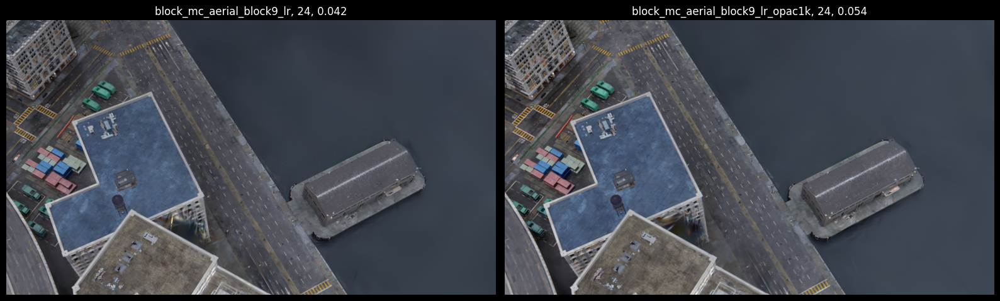

 13%|█▎        | 31/247 [00:16<02:06,  1.71it/s]

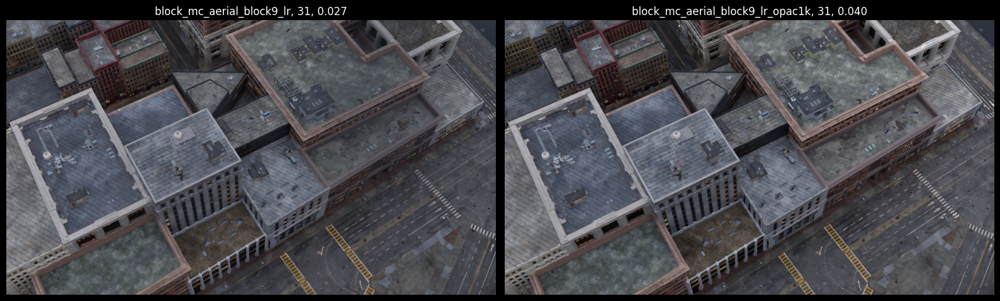

 26%|██▋       | 65/247 [00:34<01:23,  2.17it/s]

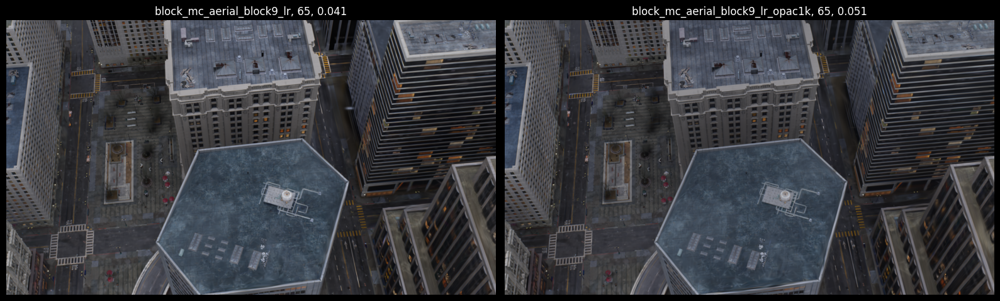

 46%|████▌     | 113/247 [00:59<01:12,  1.84it/s]

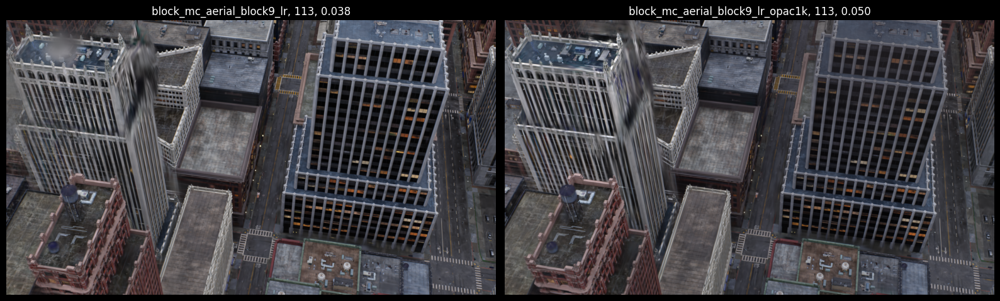

 50%|████▉     | 123/247 [01:05<01:00,  2.04it/s]

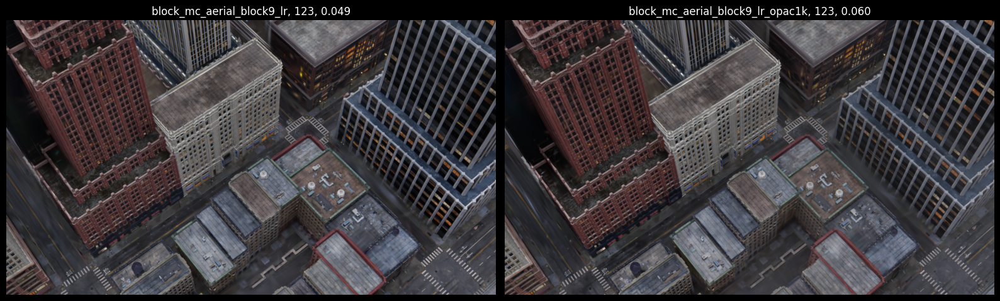

 61%|██████    | 151/247 [01:21<00:50,  1.90it/s]

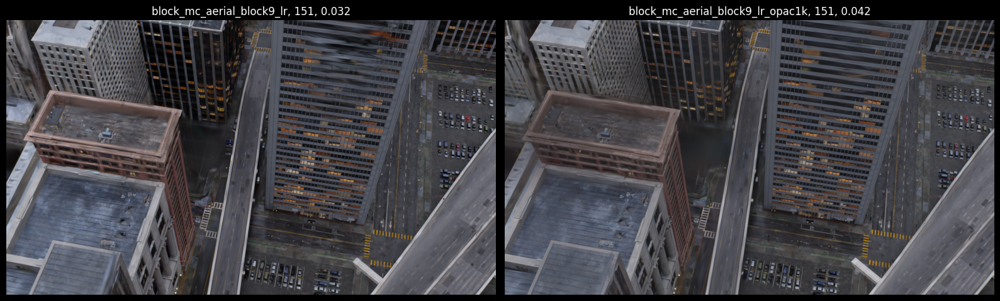

 65%|██████▌   | 161/247 [01:27<00:41,  2.05it/s]

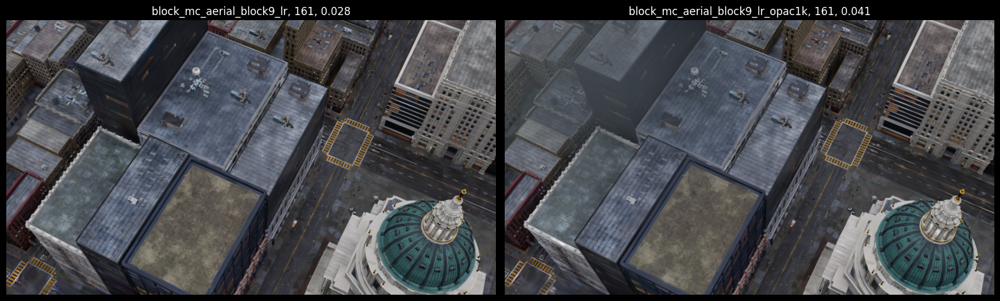

100%|█████████▉| 246/247 [02:17<00:00,  1.75it/s]

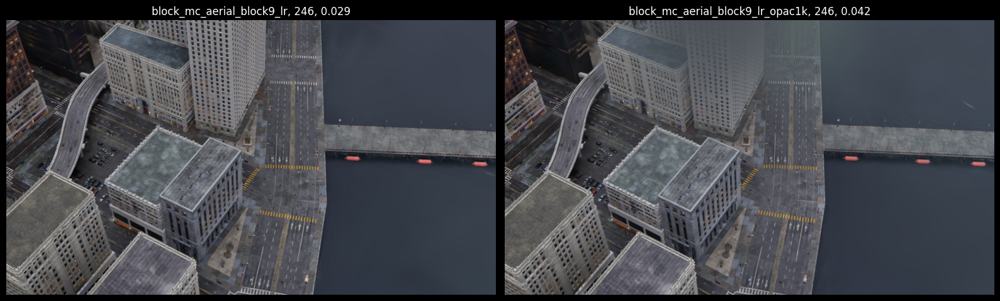

100%|██████████| 247/247 [02:18<00:00,  1.78it/s]

num_better: 8


In [14]:
# idx = random.randint(0, len(image_paths_1) - 1)

num_better = 0
for idx in tqdm(range(len(image_paths_1))):
    image_1 = plt.imread(image_paths_1[idx])
    image_2 = plt.imread(image_paths_2[idx])
    image_gt = plt.imread(image_paths_gt[idx])
    Ll1 = l1_loss(torch.tensor(image_1), torch.tensor(image_gt))
    loss_1 = (1.0 - 0.2) * Ll1 + 0.2 * (1.0 - ssim(torch.tensor(image_1), torch.tensor(image_gt)))

    Ll2 = l1_loss(torch.tensor(image_2), torch.tensor(image_gt))
    loss_2 = (1.0 - 0.2) * Ll2 + 0.2 * (1.0 - ssim(torch.tensor(image_2), torch.tensor(image_gt)))

    if loss_2 - loss_1 > 0.01 :
        num_better += 1
        plt.figure(figsize=(16, 8))
        plt.subplot(1, 2, 1)
        plt.imshow(plt.imread(image_paths_1[idx]))
        plt.title(f"{result_path_1}, {idx}, {loss_1:.3f}")
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(plt.imread(image_paths_2[idx]))
        plt.title(f"{result_path_2}, {idx}, {loss_2:.3f}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()
print(f"num_better: {num_better}")